# Spatial Visualization: MAPS Split vs Random Split

## Objective
This notebook recovers X/Y coordinates for the MAPS train/valid split by matching rows with the full annotation dataset, then visualizes the spatial distribution of both MAPS's split and a random split to understand if MAPS used a spatial splitting strategy.

## Steps:
1. Load MAPS's train.csv and valid.csv (no coordinates)
2. Load the full annotation file (with X_cent, Y_cent)
3. Match rows by comparing feature values
4. Create location_added_train.csv and location_added_valid.csv
5. Visualize MAPS split spatially
6. Create a random split and visualize it
7. Compare the two approaches

## 1. Import Libraries and Load Data

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Set style
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (15, 10)

print("Libraries loaded successfully!")

Libraries loaded successfully!


In [3]:
# Load MAPS train/valid (no coordinates)
maps_train = pd.read_csv('cHL_CODEX_processed/train.csv')
maps_valid = pd.read_csv('cHL_CODEX_processed/valid.csv')

# Load full annotation (with coordinates)
full_annotation = pd.read_csv('../cHL_CODEX/annotation_csv/cHL_CODEX_annotation.csv')

# Load class names
class_names = pd.read_csv('cHL_CODEX_processed/class_names.csv', header=None)[0].tolist()

print(f"MAPS Train: {maps_train.shape}")
print(f"MAPS Valid: {maps_valid.shape}")
print(f"Full Annotation: {full_annotation.shape}")
print(f"\nClass Names ({len(class_names)}): {class_names}")

MAPS Train: (114984, 51)
MAPS Valid: (28746, 51)
Full Annotation: (145161, 54)

Class Names (17): ['class_id', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15']


## 2. Match Rows and Recover Coordinates

Since the MAPS files don't have unique IDs, we'll match rows by comparing all feature values (markers + cellSize). This is computationally expensive but ensures accuracy.

In [4]:
# Identify common feature columns for matching
# Exclude cell_label from maps files and cellLabel, cellType, X_cent, Y_cent from annotation
marker_cols = [col for col in maps_train.columns if col not in ['cell_label']]
print(f"Will match on {len(marker_cols)} features: {marker_cols[:5]}...")

# Verify these columns exist in annotation
missing_cols = [col for col in marker_cols if col not in full_annotation.columns]
if missing_cols:
    print(f"WARNING: Missing columns in annotation: {missing_cols}")
else:
    print("All marker columns found in annotation file!")

Will match on 50 features: ['BCL.2', 'CCR6', 'CD11b', 'CD11c', 'CD15']...
All marker columns found in annotation file!


In [5]:
def match_and_add_coordinates(df_split, full_df, marker_cols, split_name='split'):
    """
    Match each row in df_split with full_df by comparing marker values,
    then add X_cent and Y_cent coordinates.
    
    Strategy: Use a hash-based approach for faster matching.
    Round values to avoid floating point precision issues.
    """
    print(f"\n--- Processing {split_name} ---")
    print(f"Rows to match: {len(df_split)}")
    
    # Create a copy to avoid modifying original
    result_df = df_split.copy()
    
    # Round marker values for both dataframes to handle floating point issues
    decimals = 6
    df_split_rounded = df_split[marker_cols].round(decimals)
    full_df_rounded = full_df[marker_cols].round(decimals)
    
    # Create hash strings for faster matching
    print("Creating hash keys...")
    df_split_hash = df_split_rounded.apply(lambda row: hash(tuple(row)), axis=1)
    full_df_hash = full_df_rounded.apply(lambda row: hash(tuple(row)), axis=1)
    
    # Create a mapping from hash to coordinates
    hash_to_coords = dict(zip(full_df_hash, zip(full_df['X_cent'], full_df['Y_cent'])))
    
    # Match rows
    print("Matching rows...")
    matched_coords = df_split_hash.map(hash_to_coords)
    
    # Separate X and Y
    result_df['X_cent'] = matched_coords.apply(lambda x: x[0] if x is not None else np.nan)
    result_df['Y_cent'] = matched_coords.apply(lambda x: x[1] if x is not None else np.nan)
    
    # Report matching statistics
    matched_count = result_df['X_cent'].notna().sum()
    print(f"Successfully matched: {matched_count}/{len(df_split)} ({100*matched_count/len(df_split):.2f}%)")
    
    if matched_count < len(df_split):
        print(f"WARNING: {len(df_split) - matched_count} rows could not be matched!")
    
    return result_df

# Match train and valid sets
train_with_coords = match_and_add_coordinates(maps_train, full_annotation, marker_cols, 'train')
valid_with_coords = match_and_add_coordinates(maps_valid, full_annotation, marker_cols, 'valid')


--- Processing train ---
Rows to match: 114984
Creating hash keys...
Matching rows...
Successfully matched: 114984/114984 (100.00%)

--- Processing valid ---
Rows to match: 28746
Creating hash keys...
Matching rows...
Successfully matched: 28746/28746 (100.00%)


## 3. Saving the location added Files

In [6]:
# Save to CSV
train_with_coords.to_csv('location_added_train.csv', index=False)
valid_with_coords.to_csv('location_added_valid.csv', index=False)

print("Files saved successfully:")
print("  - location_added_train.csv")
print("  - location_added_valid.csv")
print(f"\nTrain shape: {train_with_coords.shape}")
print(f"Valid shape: {valid_with_coords.shape}")

Files saved successfully:
  - location_added_train.csv
  - location_added_valid.csv

Train shape: (114984, 53)
Valid shape: (28746, 53)


## 4. Visualize MAPS Split Spatially

A spatial plot showing Train (Blue) vs Validation (Orange) for each cell type.

Plotting 114984 train and 28746 valid cells


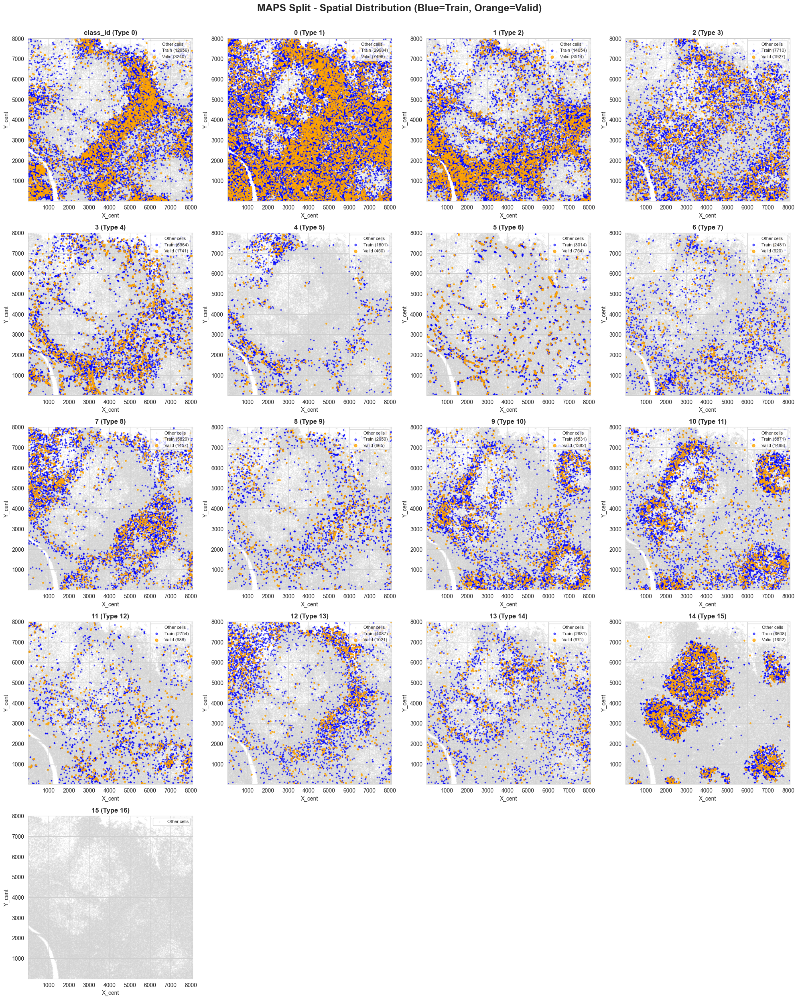

In [7]:
def plot_spatial_distribution(df_train, df_valid, class_names, title="Spatial Distribution"):
    """
    Create a grid of plots showing spatial distribution of each cell type,
    with Train (blue) and Valid (orange) points.
    """
    # Remove rows with missing coordinates
    df_train_clean = df_train.dropna(subset=['X_cent', 'Y_cent'])
    df_valid_clean = df_valid.dropna(subset=['X_cent', 'Y_cent'])
    
    print(f"Plotting {len(df_train_clean)} train and {len(df_valid_clean)} valid cells")
    
    # Get unique cell types
    n_classes = len(class_names)
    
    # Create grid
    rows = (n_classes + 3) // 4
    cols = 4
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    axes = axes.flatten()
    
    # Get global bounds for consistent viewing
    all_x = pd.concat([df_train_clean['X_cent'], df_valid_clean['X_cent']])
    all_y = pd.concat([df_train_clean['Y_cent'], df_valid_clean['Y_cent']])
    x_min, x_max = all_x.min(), all_x.max()
    y_min, y_max = all_y.min(), all_y.max()
    
    for i, class_name in enumerate(class_names):
        ax = axes[i]
        
        # Filter for this cell type
        train_subset = df_train_clean[df_train_clean['cell_label'] == i]
        valid_subset = df_valid_clean[df_valid_clean['cell_label'] == i]
        
        # Plot all cells in light gray as background
        ax.scatter(df_train_clean['X_cent'], df_train_clean['Y_cent'], 
                   c='lightgray', s=1, alpha=0.2, label='Other cells')
        
        # Plot Train cells for this type in blue
        if len(train_subset) > 0:
            ax.scatter(train_subset['X_cent'], train_subset['Y_cent'], 
                       c='blue', s=3, alpha=0.6, label=f'Train ({len(train_subset)})')
        
        # Plot Valid cells for this type in orange
        if len(valid_subset) > 0:
            ax.scatter(valid_subset['X_cent'], valid_subset['Y_cent'], 
                       c='orange', s=6, alpha=0.8, label=f'Valid ({len(valid_subset)})')
        
        ax.set_title(f"{class_name} (Type {i})", fontsize=12, fontweight='bold')
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.set_aspect('equal')
        ax.legend(loc='upper right', fontsize=8, markerscale=2)
        ax.set_xlabel('X_cent')
        ax.set_ylabel('Y_cent')
    
    # Hide unused subplots
    for j in range(i+1, len(axes)):
        axes[j].axis('off')
    
    plt.suptitle(title, fontsize=18, fontweight='bold', y=0.995)
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    plt.show()

# Plot MAPS split
plot_spatial_distribution(train_with_coords, valid_with_coords, class_names, 
                          title="MAPS Split - Spatial Distribution (Blue=Train, Orange=Valid)")

## 5. Creating Random Split and Visualize

Random 80/20 split of the same data and visualizing it for comparison.

Total cells in MAPS split: 143730
Random Train: 114984
Random Valid: 28746
Plotting 114984 train and 28746 valid cells


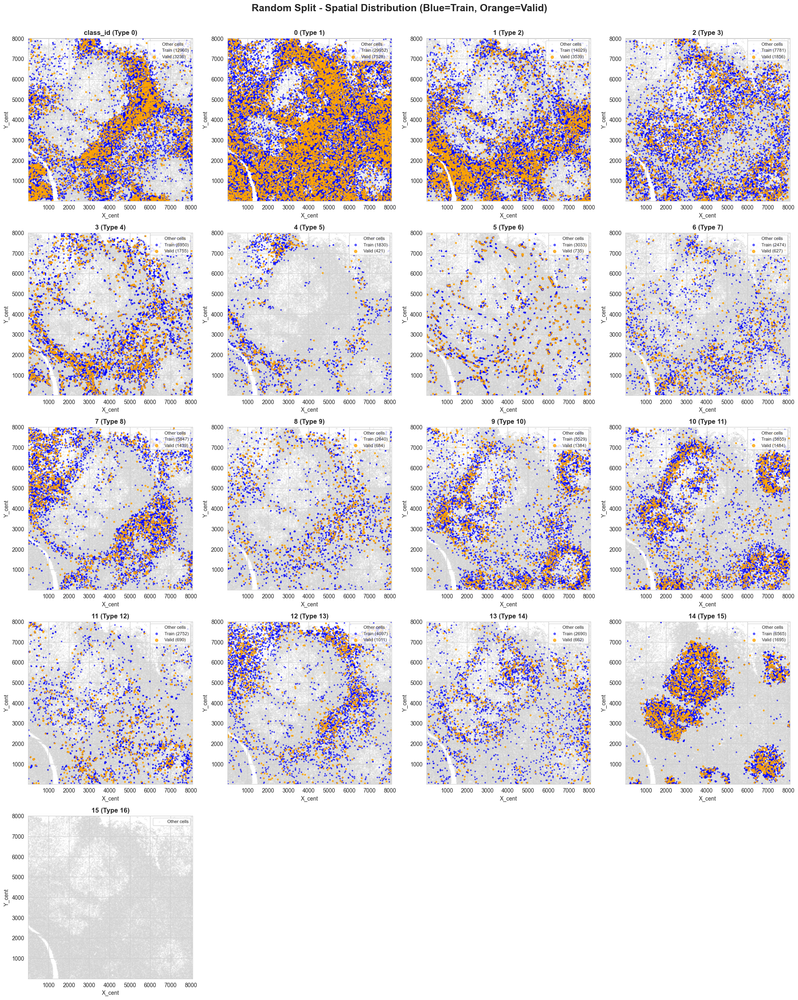

In [8]:
# Create random split from full annotation
from sklearn.model_selection import train_test_split

# Use the same cells that MAPS used (those that matched)
maps_cells = pd.concat([train_with_coords, valid_with_coords])
maps_cells_clean = maps_cells.dropna(subset=['X_cent', 'Y_cent'])

print(f"Total cells in MAPS split: {len(maps_cells_clean)}")

# Random 80/20 split
random_train, random_valid = train_test_split(maps_cells_clean, test_size=0.2, random_state=42)

print(f"Random Train: {len(random_train)}")
print(f"Random Valid: {len(random_valid)}")

# Plot random split
plot_spatial_distribution(random_train, random_valid, class_names,
                          title="Random Split - Spatial Distribution (Blue=Train, Orange=Valid)")

## 6. Overall Spatial Comparison


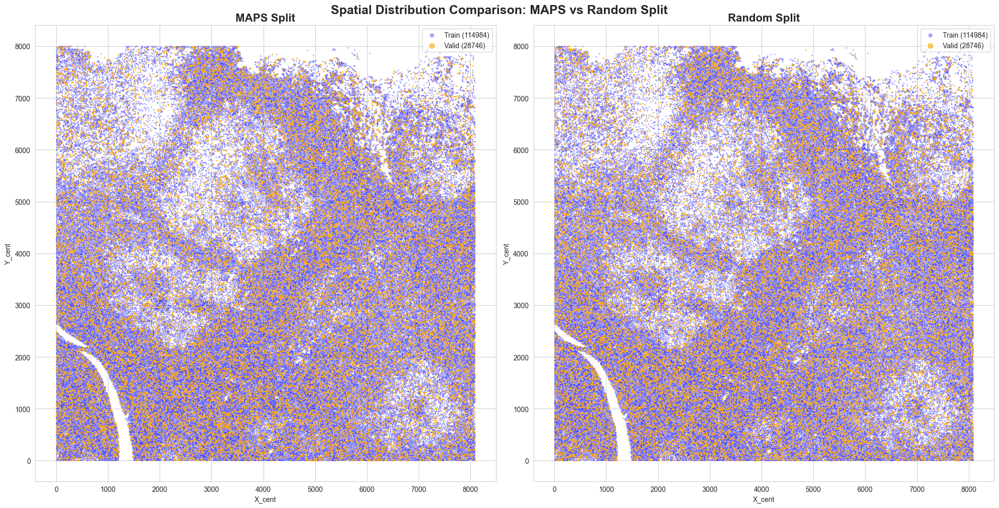

In [11]:
# Create a simple overall view
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# MAPS Split
train_clean = train_with_coords.dropna(subset=['X_cent', 'Y_cent'])
valid_clean = valid_with_coords.dropna(subset=['X_cent', 'Y_cent'])

axes[0].scatter(train_clean['X_cent'], train_clean['Y_cent'], 
                c='blue', s=1, alpha=0.3, label=f'Train ({len(train_clean)})')
axes[0].scatter(valid_clean['X_cent'], valid_clean['Y_cent'], 
                c='orange', s=2, alpha=0.6, label=f'Valid ({len(valid_clean)})')
axes[0].set_title('MAPS Split', fontsize=16, fontweight='bold')
axes[0].set_xlabel('X_cent')
axes[0].set_ylabel('Y_cent')
axes[0].legend(markerscale=5)
axes[0].set_aspect('equal')

# Random Split
axes[1].scatter(random_train['X_cent'], random_train['Y_cent'], 
                c='blue', s=1, alpha=0.3, label=f'Train ({len(random_train)})')
axes[1].scatter(random_valid['X_cent'], random_valid['Y_cent'], 
                c='orange', s=2, alpha=0.6, label=f'Valid ({len(random_valid)})')
axes[1].set_title('Random Split', fontsize=16, fontweight='bold')
axes[1].set_xlabel('X_cent')
axes[1].set_ylabel('Y_cent')
axes[1].legend(markerscale=5)
axes[1].set_aspect('equal')

plt.suptitle('Spatial Distribution Comparison: MAPS vs Random Split', fontsize=18, fontweight='bold')
plt.tight_layout()
plt.show()


## 7. Analysis Summary

Check the validation set distribution statistics.

In [10]:
# Calculate spatial clustering metrics
from scipy.spatial.distance import pdist

def calculate_spatial_clustering(df):
    """Calculate average nearest neighbor distance as a measure of clustering."""
    coords = df[['X_cent', 'Y_cent']].values
    if len(coords) < 2:
        return np.nan
    
    # Sample if too large
    if len(coords) > 1000:
        coords = coords[np.random.choice(len(coords), 1000, replace=False)]
    
    # Calculate pairwise distances
    distances = pdist(coords)
    return np.median(distances)

print("Spatial Clustering Analysis:")
print("\nMAPS Split:")
maps_valid_clustering = calculate_spatial_clustering(valid_clean)
print(f"  Valid set median distance: {maps_valid_clustering:.2f}")

print("\nRandom Split:")
random_valid_clustering = calculate_spatial_clustering(random_valid)
print(f"  Valid set median distance: {random_valid_clustering:.2f}")

print("\nInterpretation:")
if maps_valid_clustering < random_valid_clustering * 0.9:
    print("  ⚠️  MAPS validation cells are MORE CLUSTERED → Likely spatial split!")
elif maps_valid_clustering > random_valid_clustering * 1.1:
    print("  ✓  MAPS validation cells are MORE DISPERSED → Likely random split")
else:
    print("  →  Similar clustering → Inconclusive, check visual plots above")

Spatial Clustering Analysis:

MAPS Split:
  Valid set median distance: 3838.70

Random Split:
  Valid set median distance: 3967.87

Interpretation:
  →  Similar clustering → Inconclusive, check visual plots above
